# Advance Lane Finding project
###T his project is a simple solution to finding lanes for the Advance Lane Finding Project in the udacity nano degree. The steps followed are:
1. calibrate camera
2. Undistort Image
3. Color gradient
4. Alter perspective
5. Find lane pixels
    * Use sliding window
    * skip sliding window if previous best fit
6. Fit polinomial
7. Project results to original image



## Setup

In [301]:
import numpy as np
import pickle
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline 

## 1. camera callibration
First we'll set up a LaneFinder class that will have the camera method and other useful attributes.
We will run the calibration everytime the class is instantiated inside the __init__ method.
We then store the output values in the class attributes. i.e self.ret, self.mtx, self.dist, self.rvecs, self.tvecs.

In [302]:
def calibrate():
    """Calibrates camera using the .jpg images in the ./camera_cal/ folder. Images start with calibration"""
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    undistorted_chessboards = []
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            undistorted_chessboards.append(img)
    #         
    img = cv2.imread('./camera_cal/calibration1.jpg')
    #Calibrate
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)

    return undistorted_chessboards, ret, mtx, dist, rvecs, tvecs



### Test calibration method

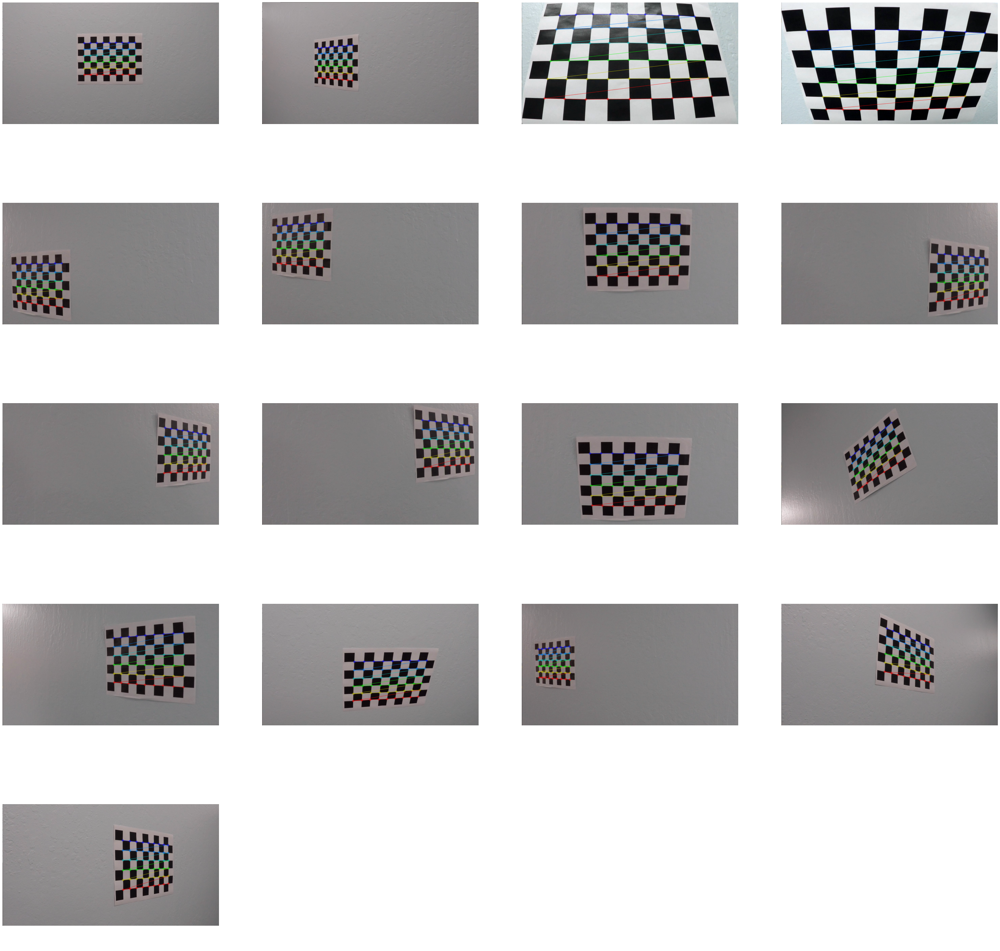

In [303]:
u_imgs, ret, mtx, dist, rvecs, tvecs = calibrate()

fig,axes = plt.subplots(nrows = 5, ncols = 4, figsize=(50,50))
for ax in axes.flatten():
    ax.axis('off')
    
for i, u_img, in enumerate(u_imgs):
    if i == 0:
        row = i
    else:
        row = i//4
    col = i-(row*4)
    axes[row,col].imshow(u_img)
plt.show()

## 2. Undistort Image
We now add the undistort method to the LaneFinder class

In [304]:
def undistort(img):    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


### Test undistort

Text(0.5, 1.0, 'Undistorted')

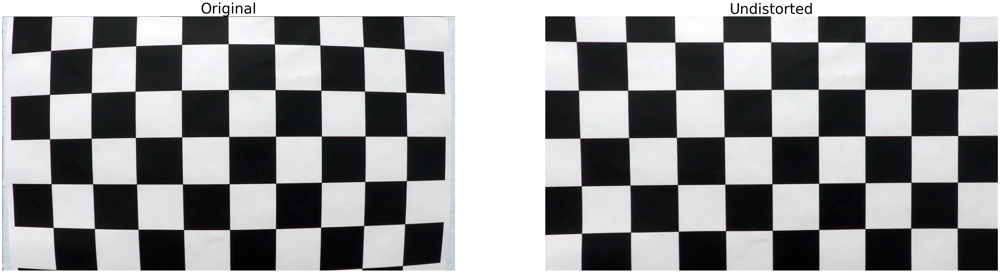

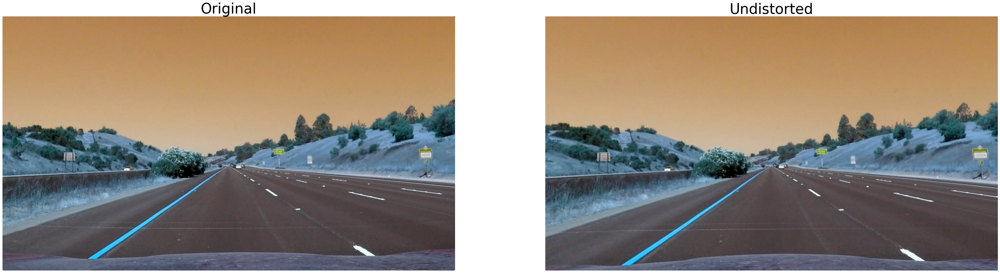

In [305]:
u_imgs, ret, mtx, dist, rvecs, tvecs = calibrate()
img = cv2.imread('./camera_cal/calibration1.jpg')
u_img = undistort(img)


f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(u_img)
x2.set_title('Undistorted', fontsize=40)

img = cv2.imread('./test_images/straight_lines1.jpg')
u_img = undistort(img)
f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(u_img)
x2.set_title('Undistorted', fontsize=40)


## 3. Color Gradient
He we use change the color of the image to more clear see the lane lines. We'll use gray scale, HLS, and the stack the into one image.

In [306]:
def color_and_gradient(img_undistorted, s_thresh=(170, 255), sx_thresh=(20, 255)):
    img = np.copy(img_undistorted)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # combine color and gradient image
    cg_img = np.zeros_like(sxbinary)
    cg_img[(s_binary == 1) | (sxbinary == 1)] = 1

    return cg_img

Text(0.5, 1.0, 'Color and Gradient')

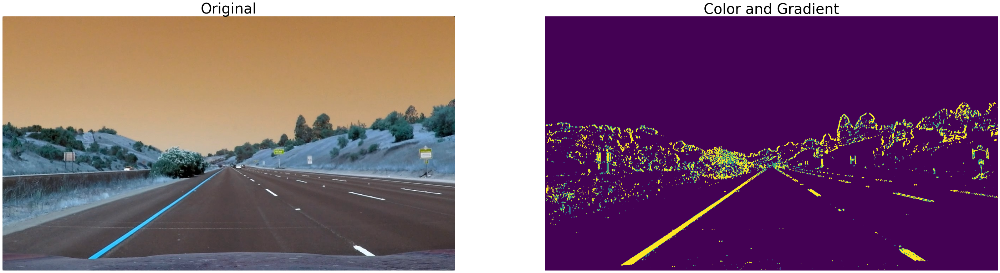

In [319]:
cg_img = color_and_gradient(u_img)

img = cv2.imread('./test_images/straight_lines1.jpg')
u_img = undistort(img)
f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(cg_img)
x2.set_title('Color and Gradient', fontsize=40)


## Alter perspective
Change perspective to top.

In [320]:
def alter_perspective(cg_img, edges=(9,6)):
    img = cg_img
    #Hyper parameters for perspective distortion     
    top_right = (705, 450)
    top_left = (565, 450)
    bottom_right = (1200, 670)
    bottom_left = (0, 680)

    img_size = (img.shape[1], cg_img.shape[0])
    width = img.shape[1]
    height = img.shape[0]
    # Quadrangle verties coordinates in the source image
    s1 = [width // 2 - 76, height * 0.625]
    s2 = [width // 2 + 76, height * 0.625]
    s3 = [-100, height]
    s4 = [width + 100, height]
    src = np.float32([s1, s2, s3, s4])
    # Quadrangle verties coordinates in the destination image
    d1 = [100, 0]
    d2 = [width - 100, 0]
    d3 = [100, height]
    d4 = [width - 100, height]
    dst = np.float32([d1, d2, d3, d4])    

    M = cv2.getPerspectiveTransform(src, dst)
    Mrec = cv2.getPerspectiveTransform(dst, src)
    top_perspective_img = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)    
    return top_perspective_img, Mrec

Text(0.5, 1.0, 'Perspective')

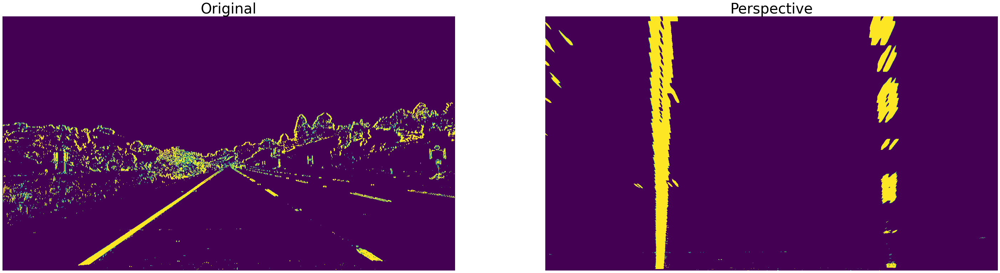

In [321]:
altered_img, Mrec = alter_perspective(cg_img)
%matplotlib inline
f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(cg_img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(altered_img)
x2.set_title('Perspective', fontsize=40)

## Find Lane Pixels
### Sliding window


In [310]:
def sliding_window_search(altered_img):
    binary_warped = altered_img
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    nwindows = 9
    margin = 100
    minpix = 10

    window_height = np.int(binary_warped.shape[0]//nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    leftx_current = leftx_base
    rightx_current = rightx_base

    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):

        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin 
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin 

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        

        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    #Polyfit
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return out_img, (leftx, lefty), (rightx, righty), left_fit, right_fit, ploty, left_fitx, right_fitx

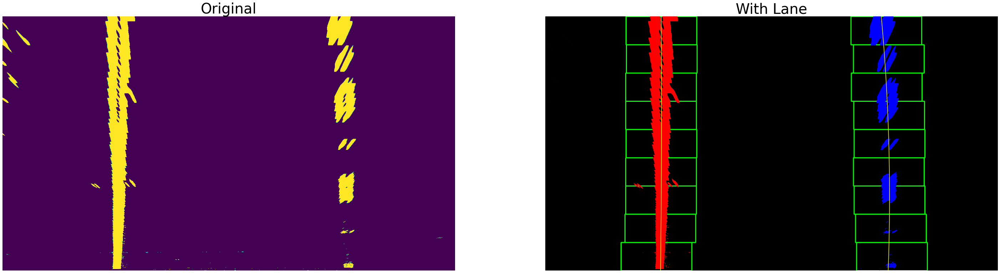

In [322]:
result_img, (leftx, lefty), (rightx, righty), left_fit, right_fit, ploty, left_fitx, right_fitx = sliding_window_search(altered_img)

f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(altered_img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(result_img)
x2.set_title('With Lane', fontsize=40)
x2.plot(left_fitx, ploty, color='yellow')
x2.plot(right_fitx, ploty, color='yellow')


## Calculate curvature and absolute position

In [317]:
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    y_eval = np.max(ploty) * ym_per_pix

    left_fit_scaled = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_scaled = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)


    left_curverad = ((1 + (2 * left_fit_scaled[0] * y_eval  + left_fit_scaled[1])**2)**1.5)/np.absolute(2*left_fit_scaled[0])  ## Implement the calculation of the left line here
    right_curverad =  ((1 + (2 * right_fit_scaled[0] * y_eval + right_fit_scaled[1])**2)**1.5)/np.absolute(2*right_fit_scaled[0])  ## Implement the calculation of the right line here

    right_pos = (left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2])
    left_pos = (right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2])
    centre_pos = (right_pos + left_pos)/2
    centre_diff = ((result_img.shape[1]/2) - centre_pos) * xm_per_pix

    return left_curverad, right_curverad, centre_diff 

## Draw resulting image unto the original image

In [315]:
def project_to_original_img(warped):        
        M = Mrec
        
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty


        # Create an image to draw the lines on
        warped_binary = np.zeros_like(warped).astype(np.uint8)
        out_img = warped

        # Recast the x and y points into usable format for cv2.fillPoly()
        left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((left, right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(out_img, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        out = cv2.warpPerspective(out_img, M, (img.shape[1], img.shape[0])) 
        
        left_curve_txt = "Left Radius: "+ str(int(left_curverad))+ "m"
        right_curve_txt = "Right Radius: "+ str(int(right_curverad))+ "m"
        centre_txt = "Car is: {:.2f}".format(centre_diff) + "m off centre"

        cv2.putText(img, left_curve_txt, (100,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        cv2.putText(img, right_curve_txt, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255), 2)
        cv2.putText(img, centre_txt, (100,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2 )

        # Combine the result with the original image
        marked_lane_img = cv2.addWeighted(img, 1, out, 0.3, 0)
        return marked_lane_img


Text(0.5, 1.0, 'Original')

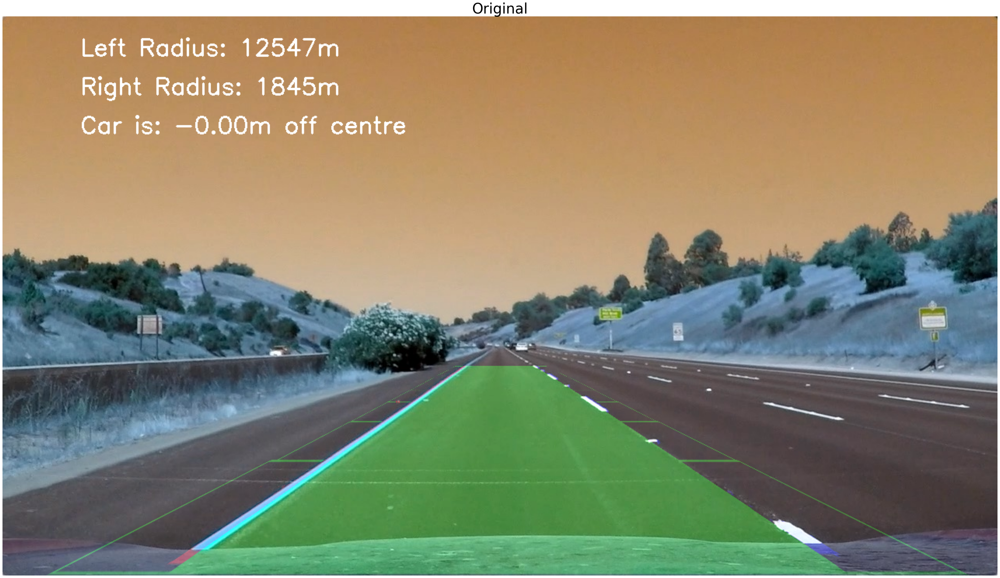

In [323]:
left_curverad, right_curverad, centre_diff = measure_curvature_real()
marked_lane_img = project_to_original_img(result_img)
f, (x) = plt.subplots(1, 1, figsize=(50, 50))
x.figsize=(50, 50)
x.axis('off')
x.imshow(marked_lane_img)
x.set_title('Original', fontsize=40)

## Combine everything into a neat package
We'll now combine all those methods above into one class. 
We'll also refactor add a few more things:
* Skipping the sliding window for subsequents images for video
* Sanity check for lane lines (check best fit)


In [290]:
import numpy as np
import pickle
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque

%matplotlib inline 
 
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, allx=None, ally=None):
        # was the line detected in the last iteration?
        self.detected = False     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #x values for detected line pixels
        self.allx = allx
        #y values for detected line pixels
        self.ally = ally 
            
    def add_best_fit(self, new_fit):
        self.best_fit = new_fit
        self.current_fit.append(new_fit)
        if len(self.current_fit)> 4:
            self.best_fit = np.average(self.current_fit, axis=0)
        self.detected = True
                
    def check_add_fit(self, new_fit): 
        if new_fit.any():
            if self.best_fit is None:
                self.add_best_fit(new_fit)
            else:
                delta_fit = abs(new_fit - self.best_fit)
 
                if ((delta_fit[0] < 0.000001 or delta_fit[1] < 0.0001) or delta_fit[2] < 1.) and len(self.current_fit) < 0:
                    self.add_best_fit(new_fit)
                else:
                    self.detected = False
        else:
            self.detected = False
            self.current_fit.append(np.average(self.current_fit, axis=0))
       
class LaneFinder:
    def __init__(self):
        self.img = None
        self.cg_img = None
        self.top_perspective_img = None
        self.M = None
        self.left_lane = Line()
        self.right_lane = Line()
        self.nwindows = 9
        self.left_fit =  np.array([0,0,0], dtype='float') 
        self.right_fit =  np.array([0,0,0], dtype='float') 
        self.poly_fitted_img = None
        self.marked_lane_img = None
        self.nwindows = 9
        self.margin = 100
        self.minpix = 10
        
        self.calibrate()


    def find_lane(self, img):
        self.img = img
        self.prepare_img()
        
        if not self.left_lane.detected or not self.right_lane.detected:
            self.sliding_window_search()
        else:
            self.search_around_poly()
        self.fit_polynomial()
        self.measure_curvature_real()

        self.draw_lane()
        return self.marked_lane_img
        
    def calibrate(self):
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((6*9,3), np.float32)
        objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # Make a list of calibration images
        images = glob.glob('./camera_cal/calibration*.jpg')

        # Step through the list and search for chessboard corners
        for fname in images:
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)

                # Draw and display the corners
                img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #         cv2.imshow('img',img)
        img = cv2.imread(images[0])
        #Calibrate
        self.ret, self.mtx, self.dist, self.rvecs, self.tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)
    
    def prepare_img(self):
        img_undistorted = self.undistort()
        self.color_and_gradient(img_undistorted)
        self.alter_perspective()


    def undistort(self):    
        undist = cv2.undistort(self.img, self.mtx, self.dist, None, self.mtx)
        return undist

    def alter_perspective(self, edges=(9,6)):
        img = self.cg_img
        #Hyper parameters for perspective distortion     
        top_right = (725, 455)
        top_left = (555, 455)
        botom_right = (1280, 680)
        botom_left = (0, 680)
        
        img_size = (img.shape[1], img.shape[0])
        src = np.float32([[top_right], [top_left], [bottom_right], [bottom_left]])
        dst = np.float32([[img.shape[1], 0], [0,0], 
                                     [img.shape[1], img.shape[0]], 
                                     [0, img.shape[0]]])    
        
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Mrec = cv2.getPerspectiveTransform(dst, src)
        self.top_perspective_img = cv2.warpPerspective(img, self.M, img_size, flags=cv2.INTER_LINEAR)    
        return self.top_perspective_img, self.Mrec

    def color_and_gradient(self, img_undistorted, s_thresh=(190, 255), sx_thresh=(20, 100)):
        img = np.copy(img_undistorted)
        # Convert to HLS color space and separate the V channel
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        l_channel = hls[:,:,1]
        s_channel = hls[:,:,2]

        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Sobel x
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
        abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

        # Threshold x gradient
        sxbinary = np.zeros_like(scaled_sobel)
        sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

        # Threshold color channel
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
        # Stack each channel
        color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
        
        # combine color and gradient image
        self.cg_img = np.zeros_like(sxbinary)
        self.cg_img[(s_binary == 1) | (sxbinary == 1)] = 1

        return self.cg_img

    def sliding_window_search(self):
        perspective_img = self.top_perspective_img
        histogram = np.sum(perspective_img[perspective_img.shape[0]//2:,:], axis=0)
        self.poly_fitted_img = np.dstack((perspective_img, perspective_img, perspective_img))
        midpoint = np.int(histogram.shape[0]//2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        window_height = np.int(perspective_img.shape[0]//self.nwindows)
        nonzero = perspective_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        leftx_current = leftx_base
        rightx_current = rightx_base

        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(self.nwindows):

            win_y_low = perspective_img.shape[0] - (window+1)*window_height
            win_y_high = perspective_img.shape[0] - window*window_height
            win_xleft_low = leftx_current - self.margin  
            win_xleft_high = leftx_current + self.margin 
            win_xright_low = rightx_current - self.margin  
            win_xright_high = rightx_current + self.margin 

            # Draw the windows on the visualization image
            cv2.rectangle(self.poly_fitted_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(self.poly_fitted_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 

            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            if len(good_left_inds) > self.minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > self.minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        self.left_lane = Line(leftx, lefty)
        self.right_lane = Line(rightx, righty)
        
        return self.poly_fitted_img
    
    def fit_polynomial(self):        
        warped_binary = np.zeros_like(self.top_perspective_img).astype(np.uint8)
        self.poly_fitted_img = np.dstack((warped_binary, warped_binary, warped_binary))
        
        leftx = self.left_lane.allx
        lefty = self.left_lane.ally
        rightx = self.right_lane.allx
        righty = self.right_lane.ally

        left_fit = np.polyfit(self.left_lane.ally, self.left_lane.allx, 2)
        self.left_lane.check_add_fit(left_fit)
        right_fit = np.polyfit(self.right_lane.ally, self.right_lane.allx, 2)
        self.right_lane.check_add_fit(right_fit)

        # Generate x and y values for plotting
        self.ploty = np.linspace(0, self.top_perspective_img.shape[0]-1, self.top_perspective_img.shape[0])

        self.poly_fitted_img[lefty, leftx] = [255, 0, 0]
        self.poly_fitted_img[righty, rightx] = [255, 0, 0]

        return self.poly_fitted_img

    def search_around_poly(self):
        margin = self.margin

        # Grab activated pixels
        perspective_img = self.top_perspective_img
        nonzero = perspective_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        left_lane_inds = ((nonzerox > (self.left_lane.best_fit[0]*(nonzeroy**2) + self.left_lane.best_fit[1]*nonzeroy + 
                        self.left_lane.best_fit[2] - margin)) & (nonzerox < (self.left_lane.best_fit[0]*(nonzeroy**2) + 
                        self.left_lane.best_fit[1]*nonzeroy + self.left_lane.best_fit[2] + margin)))
        right_lane_inds = ((nonzerox > (self.right_lane.best_fit[0]*(nonzeroy**2) + self.right_lane.best_fit[1]*nonzeroy + 
                        self.right_lane.best_fit[2] - margin)) & (nonzerox < (self.right_lane.best_fit[0]*(nonzeroy**2) + 
                        self.right_lane.best_fit[1]*nonzeroy + self.right_lane.best_fit[2] + margin)))

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        self.left_lane.allx = leftx 
        self.left_lane.ally = lefty
        self.right_lane.allx = rightx
        self.right_lane.ally = righty
        
        left_fit = np.polyfit(self.left_lane.ally, self.left_lane.allx, 2)
        self.left_lane.check_add_fit(left_fit)
        right_fit = np.polyfit(self.right_lane.ally, self.right_lane.allx, 2)
        self.right_lane.check_add_fit(right_fit)


    def measure_curvature_real(self):
        left_fit = self.left_lane.best_fit
        right_fit = self.right_lane.best_fit
        ploty = self.ploty
        '''
        Calculates the curvature of polynomial functions in meters.
        '''
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        y_eval = np.max(ploty) * ym_per_pix
        
        left_fit_scaled = np.polyfit(self.left_lane.ally*ym_per_pix, self.left_lane.allx*xm_per_pix, 2)
        right_fit_scaled = np.polyfit(self.right_lane.ally*ym_per_pix, self.right_lane.allx*xm_per_pix, 2)
        

        self.left_ = ((1 + (2 * left_fit_scaled[0] * y_eval  + left_fit_scaled[1])**2)**1.5)/np.absolute(2*left_fit_scaled[0])  ## Implement the calculation of the left line here
        self.right_ =  ((1 + (2 * right_fit_scaled[0] * y_eval + right_fit_scaled[1])**2)**1.5)/np.absolute(2*right_fit_scaled[0])  ## Implement the calculation of the right line here
        
        right_pos = (left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2])
        left_pos = (right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2])
        centre_pos = (right_pos + left_pos)/2
        self.centre_dist = ((self.poly_fitted_img.shape[1]/2) - centre_pos) * xm_per_pix
        
        return self.left_, self.right_, self.centre_dist 

    def draw_lane(self):
        img = self.img
        
        warped = self.poly_fitted_img
        M = self.Mrec
        left_fit = self.left_lane.best_fit
        right_fit = self.right_lane.best_fit
        ploty = self.ploty
        
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty


        # Create an image to draw the lines on
        warped_binary = np.zeros_like(warped).astype(np.uint8)
        out_img = warped

        # Recast the x and y points into usable format for cv2.fillPoly()
        left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((left, right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(out_img, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        out = cv2.warpPerspective(out_img, M, (img.shape[1], img.shape[0])) 
        
        left_, right_, centre_dist  =  self.left_, self.right_, self.centre_dist
        left_curve_txt = "Left Radius: "+ str(int(left_))+ "m"
        right_curve_txt = "Right Radius: "+ str(int(right_))+ "m"
        centre_txt = "Position from centre: {:.2f}".format(centre_dist) + "m off centre"

        cv2.putText(img, left_curve_txt, (100,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        cv2.putText(img, right_curve_txt, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255), 2)
        cv2.putText(img, centre_txt, (100,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2 )

        # Combine the result with the original image
        self.marked_lane_img = cv2.addWeighted(self.img, 1, out, 0.3, 0)
        return self.marked_lane_img




## Test on Image

Text(0.5, 1.0, 'Original')

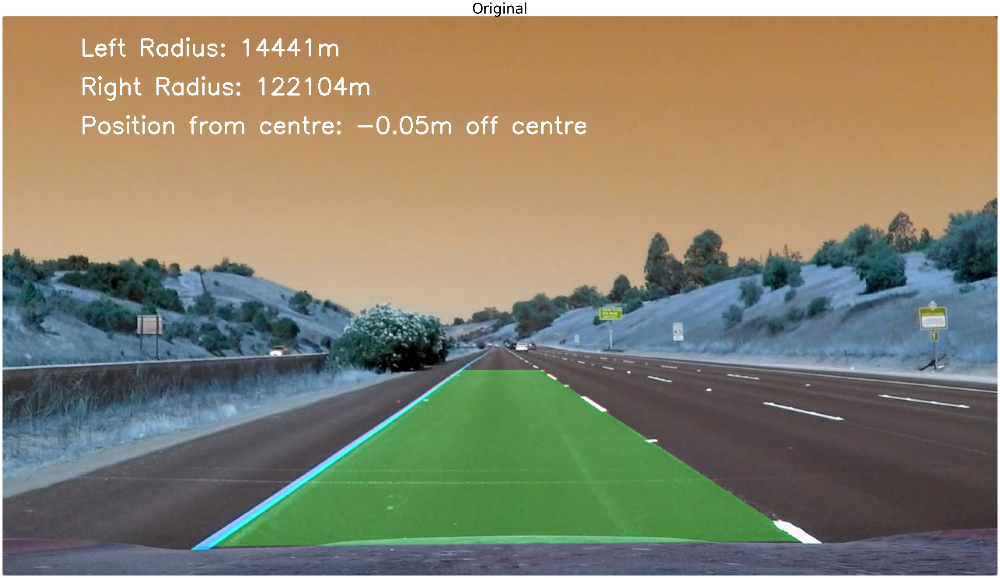

In [296]:
cv2.imread('./test_images/straight_lines1.jpg')
lane_finder = LaneFinder()
marked_lane_img = lane_finder.find_lane(img)
f, (x) = plt.subplots(1, 1, figsize=(50, 50))
x.figsize=(50, 50)
x.axis('off')
x.imshow(marked_lane_img)
x.set_title('Original', fontsize=40)


## Test on Video

In [324]:
lane_finder = LaneFinder()

def find_lane_video():
    video_output = 'project_video_output.mp4'
    clip1 = VideoFileClip("project_video.mp4")
    video_clip = clip1.fl_image(lane_finder.find_lane)
    %time video_clip.write_videofile(video_output, audio=False)

    HTML("""
    <video width="960" height="540" controls>
      <source src="{0}">
    </video>  
    """.format(video_output))

find_lane_video()





                                                      


t:  12%|█▏        | 156/1260 [1:12:51<03:56,  4.67it/s, now=None]


                                                        


t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]s, now=None]

Moviepy - Building video project_video_output.mp4.
Moviepy - Writing video project_video_output.mp4



                                                                


                                                        


t:  12%|█▏        | 156/1260 [1:16:14<03:56,  4.67it/s, now=None]


                                                        


t:  12%|█▏        | 156/1260 [1:16:14<03:56,  4.67it/s, now=None]

Moviepy - Done !
Moviepy - video ready project_video_output.mp4
CPU times: user 4min 41s, sys: 49.4 s, total: 5min 31s
Wall time: 3min 22s
